In [1]:
from IPython.display import Audio
import librosa
import soundfile as sf
import numpy as np
import matplotlib.pyplot as plt

from src.filter_estimation import *
from src.excitation_estimation import *
from src.utils import load_piano_sound, load_ikembe_sound
from src.synthesis import synthesis

plt.style.use("seaborn-v0_8-darkgrid")

## Single-channel filter and excitation estimation

In [15]:
sr = 16000
pitch = "C2"
vel = "M"

s = load_piano_sound(pitch, vel, sr)
Audio(s, rate=sr)

In [3]:
n_fft = 4096
hop_length = 1024
window_type = "hamming"

In [4]:
cum_power_spectrum = power_spectrum_3d(s, hop_length, n_fft, window_type)
cum_power_spectrum.shape

(51, 2048)

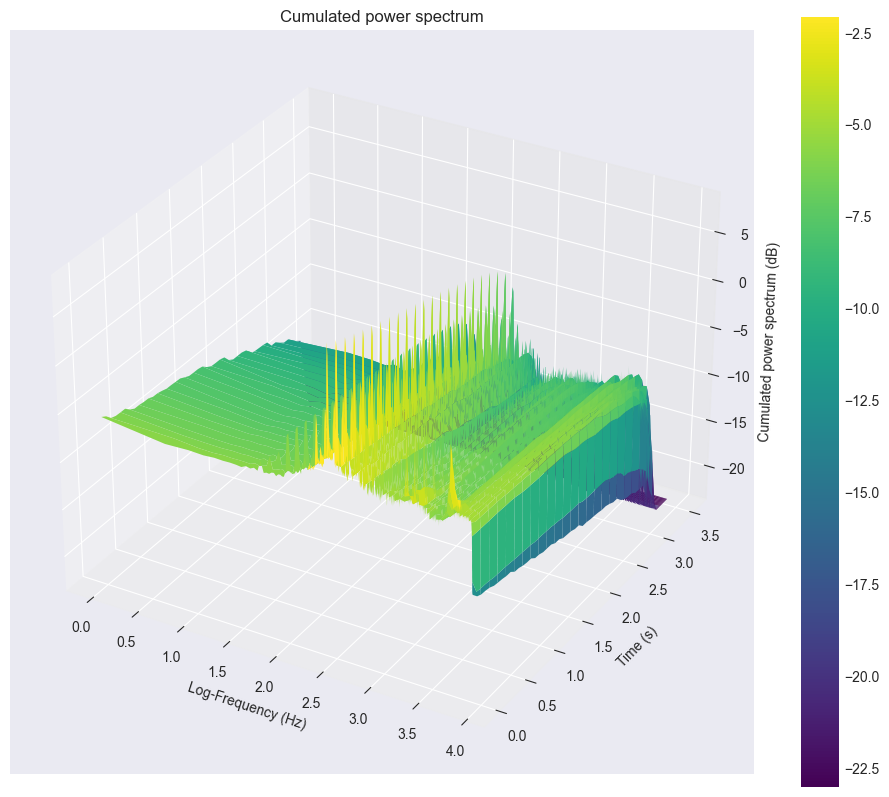

In [5]:
X = np.log10(np.linspace(1, sr / 2, n_fft // 2))
Y = np.linspace(0, len(s) / sr, len(cum_power_spectrum))
X, Y = np.meshgrid(X, Y)


fig, ax = plt.subplots(subplot_kw={"projection": "3d"})
fig.set_size_inches(12, 10)
ax.set_title('Cumulated power spectrum')
# change view angle

surf = ax.plot_surface(X, Y, cum_power_spectrum, cmap='viridis', edgecolor='none', linewidth = 0)
ax.set_xlabel('Log-Frequency (Hz)')
ax.set_ylabel('Time (s)')
ax.set_zlabel('Cumulated power spectrum (dB)')
plt.colorbar(surf)

plt.show()

In [6]:
fundamental = 261.63

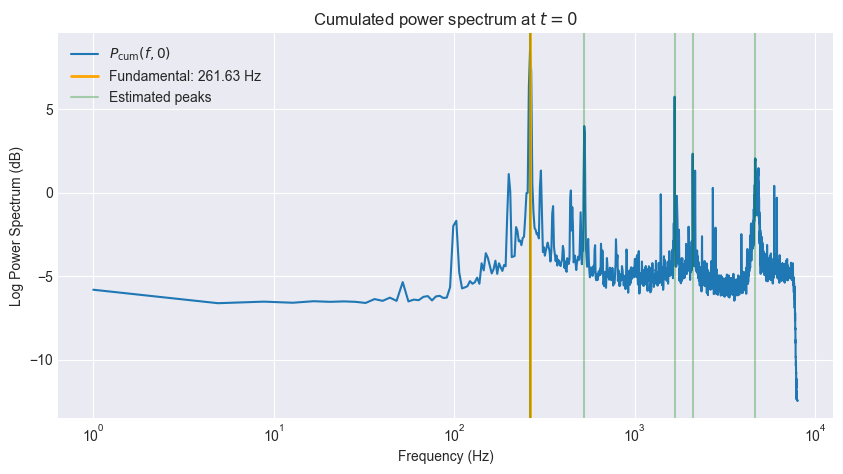

In [7]:
peaks = sig.find_peaks(cum_power_spectrum[0, :], prominence=7)[0]
f = peaks * sr / n_fft

plt.figure(figsize=(10, 5))
plt.title(r"Cumulated power spectrum at $t=0$")

X = np.linspace(1, sr / 2, n_fft // 2)
plt.plot(X, cum_power_spectrum[0, :], label = r"$P_{\mathrm{cum}}(f, 0)$")
plt.axvline(fundamental, label = f"Fundamental: {fundamental} Hz", color = "orange", linewidth = 2)

put_label = True
for freq in f:
    if put_label:
        plt.axvline(freq, color='g', alpha = .3, label = "Estimated peaks")
        put_label = False
    else:
        plt.axvline(freq, color='g', alpha = .3)

plt.legend()
plt.xlabel('Frequency (Hz)')
plt.ylabel('Log Power Spectrum (dB)')
plt.xscale('log')
plt.show()

In [8]:
poles = pole_estimator(s, sr, hop_length, n_fft, window_type, prominence=7)
poles.shape

(5,)

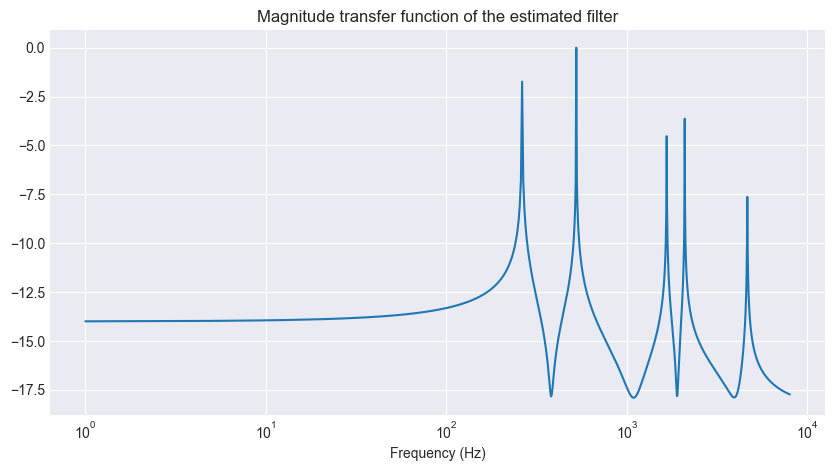

In [9]:
angle = np.exp(-1j * 2 * np.pi * np.arange(0,n_fft//2) / n_fft)
H = np.array([1 / (1 - poles[i] * angle) for i in range(len(poles))]).sum(axis = 0)
H = np.log(np.abs(H)**2/np.max(np.abs(H)**2))
X = np.linspace(1, sr / 2, n_fft // 2)

plt.figure(figsize = (10,5))
plt.title("Magnitude transfer function of the estimated filter")
plt.plot(X, H)
plt.xscale('log')
plt.xlabel('Frequency (Hz)')
plt.show()

In [10]:
N_fft = 400000
e_length = sr * 10
# We must have N_fft > len(s) + len(*IT of the filter*) - 1
print(len(s))

56000


In [11]:
e = frequency_domain_deconvolution(s, poles, N_fft, e_length)

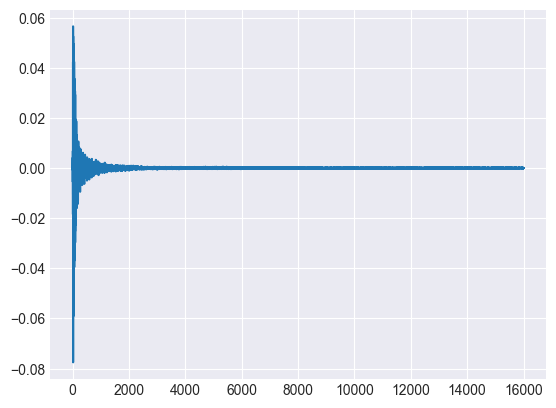

In [12]:
plt.plot(e[:sr * 1])
plt.show()
Audio(e, rate=sr)

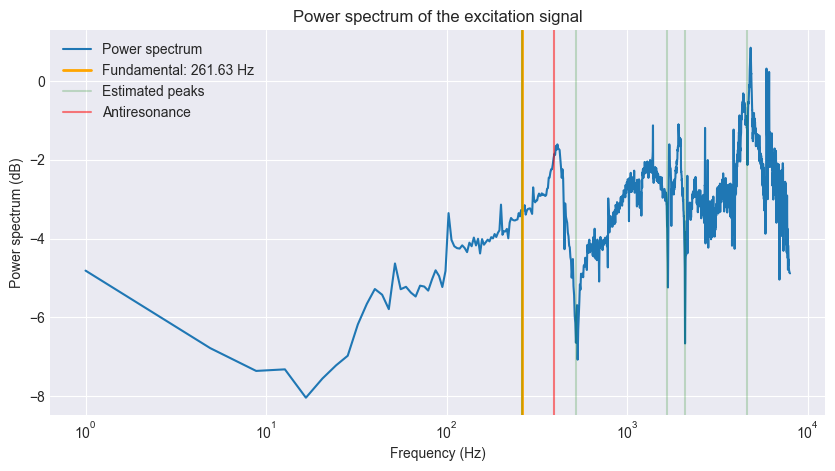

In [13]:
E = np.log(np.abs(np.fft.fft(e, n = n_fft))[:n_fft//2])
X = np.linspace(1, sr / 2, n_fft // 2)

plt.figure(figsize = (10,5))
plt.title("Power spectrum of the excitation signal")
plt.plot(X, E, label = "Power spectrum")
put_label = True
plt.axvline(fundamental, label = f"Fundamental: {fundamental} Hz", color = "orange", linewidth = 2)
for freq in f:
    if put_label:
        plt.axvline(freq, color='g', alpha = .2, label = "Estimated peaks")
        put_label = False
    else:
        plt.axvline(freq, color='g', alpha = .2)
plt.axvline(1.5 * f[0], color='r', alpha = .5, label = "Antiresonance")

plt.legend()
plt.xscale('log')
plt.xlabel('Frequency (Hz)')
plt.ylabel('Power spectrum (dB)')
plt.show()

In [14]:
x_synth = synthesis(e, poles, N_fft)
Audio(x_synth, rate=sr)

## Multi filter

In [29]:
sr = 16000
s = []
notes = ["C3", "C#3", "D3", "D#3"]
for note in notes:
    s.append(load_piano_sound(note, "M", sr))

In [30]:
n_fft = 4096
hop_length = 1024
window_type = "hamming"

In [33]:
poles = []
for i in range(len(s)):
    poles.append(pole_estimator(s[i], sr, hop_length=hop_length, n_fft=n_fft, window_type=window_type, prominence = 7))

In [34]:
print([pole.shape for pole in poles])

[(19,), (18,), (19,), (15,)]


In [36]:
N = 400000
e_length = 16000 * 5

In [37]:
e = []
for i in range(len(s)):
    e.append(frequency_domain_deconvolution(s = s[i], poles = poles[i], N_fft = N, e_length = e_length))

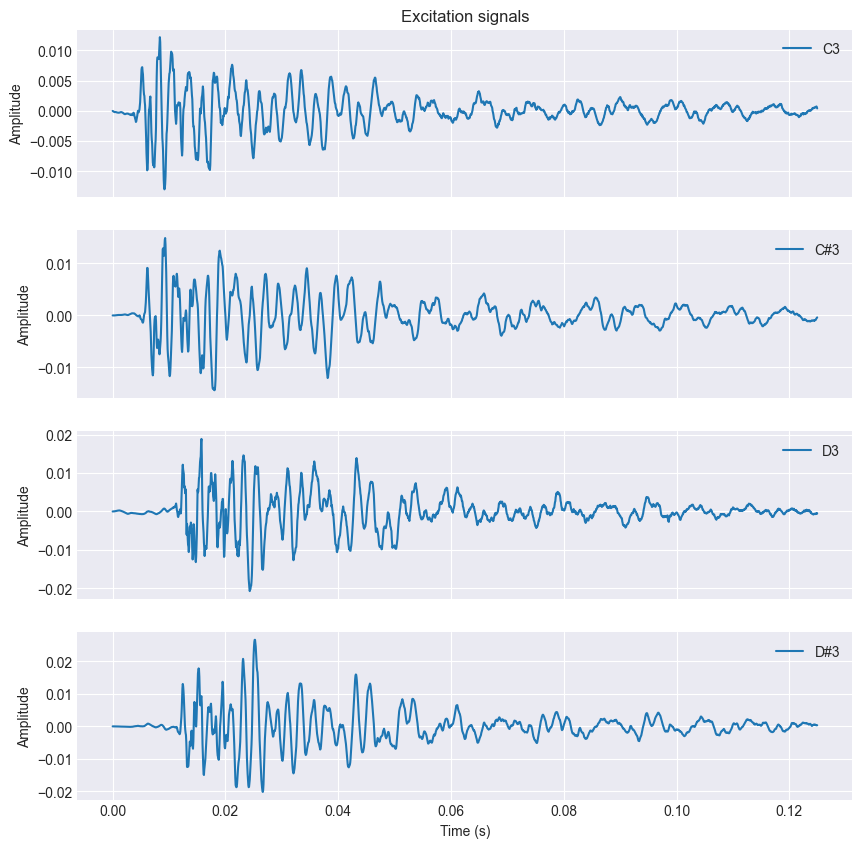

In [38]:
fig, ax = plt.subplots(len(e), 1, sharex=True)
ax[0].set_title("Excitation signals")
fig.set_size_inches((10, 10))
shown_idx = range(2000)
for i in range(len(e)):
    ax[i].plot(np.arange(0,e_length)[shown_idx] / sr, e[i][shown_idx], label = f"{notes[i]}")
    ax[i].set_ylabel('Amplitude')
    ax[i].legend()
ax[len(e) - 1].set_xlabel('Time (s)') 
plt.show()

In [39]:
energies = []
for i in range(len(e)):
    energies.append(np.sum(e[i] ** 2))

In [40]:
tau = np.zeros((len(e), len(e)))
for i in range(len(e)):
    for j in range(i + 1, len(e)):
        r_ij = np.correlate(e[i], e[j], mode = "full")
        tau[i, j] = np.argmax(r_ij) - len(e[j]) + 1
        tau[j, i] = -tau[i, j]

tau = tau.astype(int)

In [41]:
first = np.argmax(tau[0])
first

0

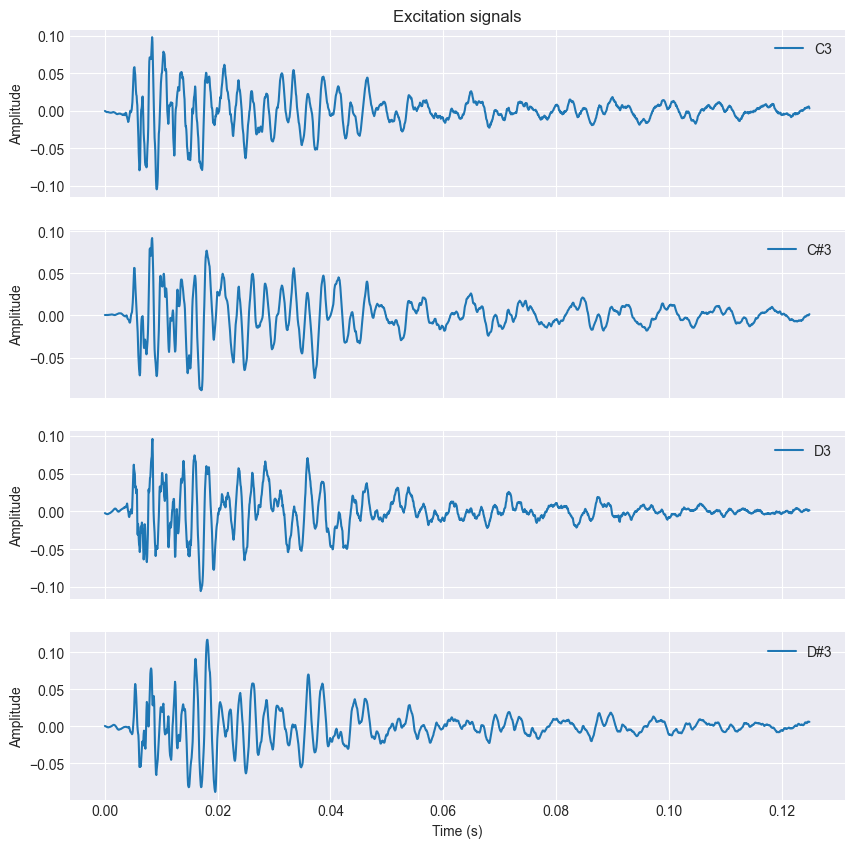

In [42]:
e_delay = []

fig, ax = plt.subplots(len(e), 1, sharex=True)
fig.set_size_inches((10, 10))
ax[0].set_title("Excitation signals")
for i in range(len(e)):
    t = - tau[first, i]
    delayed_e = np.concatenate((e[i][t:], np.zeros(t))) / np.sqrt(energies[i])
    ax[i].plot(np.arange(0,e_length)[shown_idx] / sr, delayed_e[shown_idx], label = f"{notes[i]}")
    e_delay.append(delayed_e)
    ax[i].set_ylabel('Amplitude')
    ax[i].legend()
ax[len(e) - 1].set_xlabel('Time (s)')

plt.show()

In [43]:
common_excitation = least_squares_deconvolution(s, poles, N, e_length)

100%|██████████| 4/4 [00:29<00:00,  7.44s/it]


In [44]:
Audio(common_excitation, rate=sr)

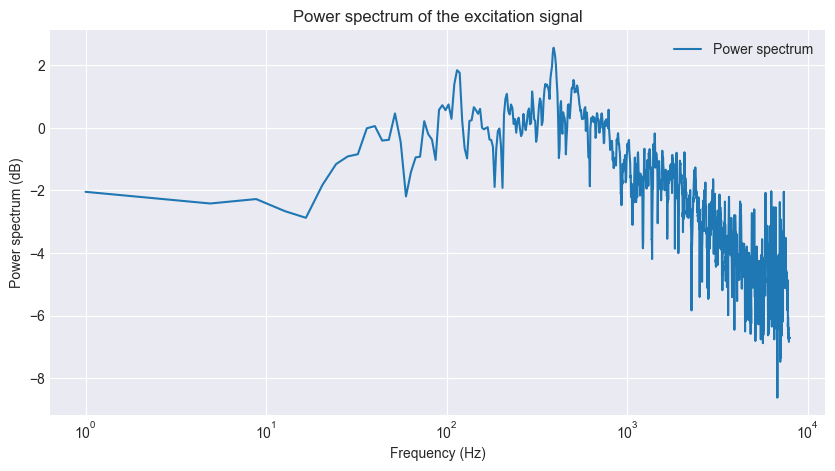

In [46]:
E = np.log(np.abs(np.fft.fft(common_excitation, n = n_fft))[:n_fft//2])
X = np.linspace(1, sr / 2, n_fft // 2)

plt.figure(figsize = (10,5))
plt.title("Power spectrum of the excitation signal")
plt.plot(X, E, label = "Power spectrum")

plt.legend()
plt.xscale('log')
plt.xlabel('Frequency (Hz)')
plt.ylabel('Power spectrum (dB)')
plt.show()

In [47]:
delay = 5000
sum_excitation = np.concatenate((common_excitation, np.zeros(delay))) + np.concatenate((np.zeros(delay), common_excitation))
sum_excitation = np.concatenate((sum_excitation, np.zeros(delay))) + np.concatenate((np.zeros(delay), sum_excitation))
sum_excitation = np.concatenate((sum_excitation, np.zeros(delay))) + np.concatenate((np.zeros(delay), sum_excitation))
sum_excitation = np.concatenate((sum_excitation, np.zeros(delay))) + np.concatenate((np.zeros(delay), sum_excitation))
sum_excitation = np.concatenate((sum_excitation, np.zeros(delay))) + np.concatenate((np.zeros(delay), sum_excitation))
sum_excitation = np.concatenate((sum_excitation, np.zeros(delay))) + np.concatenate((np.zeros(delay), sum_excitation))

In [54]:
x_synth = synthesis(sum_excitation, poles[2], N)
Audio(x_synth, rate=sr)

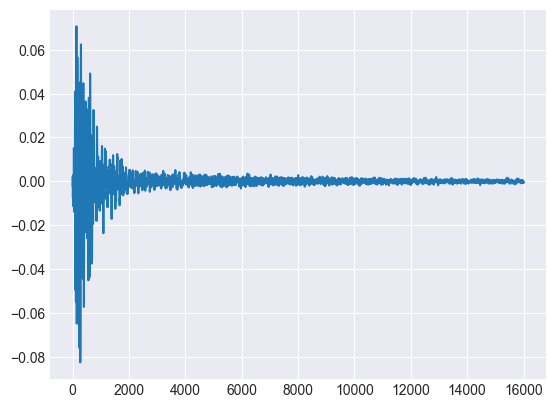

In [55]:
plt.plot(common_excitation[:16000])

## Variation of excitation w.r.t velocity

In [33]:
sr = 16000
s = []
vels = ["H", "M", "S"]
for vel in vels:
    path_note = f"data/yamaha/060_C3_{vel}.wav"
    audio, sr = librosa.load(path_note, sr=sr, mono=True)
    s.append(audio)

In [34]:
hop_length = 1024
n_fft = 4096
e_length = 16000 * 3
N = 400000

In [35]:
poles = []
for signal in s:
    poles.append(pole_estimator(signal, sr, hop_length=hop_length, n_fft=n_fft, window_type="hamming", prominence = 7))

In [36]:
excitations = []
for i in range(len(s)):
    excitations.append(frequency_domain_deconvolution(s = s[i], poles = poles[i], N_fft = N, e_length = e_length))

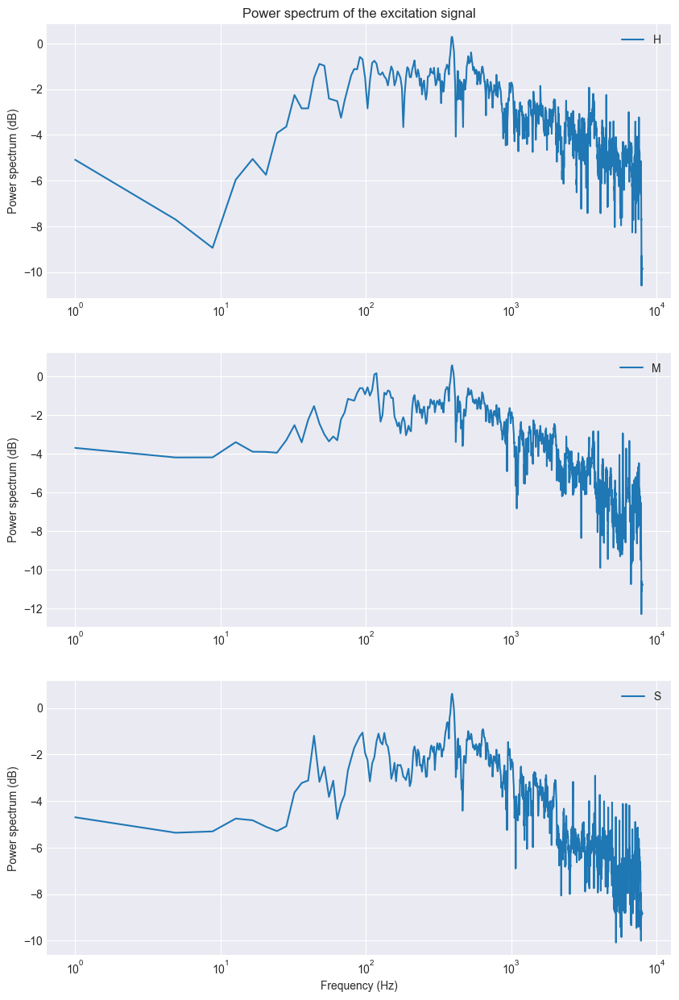

In [41]:
fig, ax = plt.subplots(3, 1)
fig.set_size_inches((10, 15))

ax[0].set_title("Power spectrum of the excitation signal")

for i in range(len(excitations)):
    
    E = np.log(np.abs(np.fft.fft(excitations[i], n = n_fft))[:n_fft//2])
    X = np.linspace(1, sr / 2, n_fft // 2)

    ax[i].plot(X, E, label = f"{vels[i]}")
    ax[i].legend()
    ax[i].set_xscale('log')
    ax[i].set_ylabel('Power spectrum (dB)')
ax[2].set_xlabel('Frequency (Hz)')
plt.show()

In [10]:
Audio(excitations[0], rate=sr)

In [11]:
Audio(excitations[1], rate=sr)

In [12]:
Audio(excitations[2], rate=sr)

In [13]:
common_excitation = least_squares_deconvolution(s, poles, N, e_length)

100%|██████████| 3/3 [00:05<00:00,  1.94s/it]


In [22]:
synth = synthesis(common_excitation, poles[0], N)
Audio(synth, rate=sr)

In [23]:
synth = synthesis(common_excitation, poles[1], N)
Audio(synth, rate=sr)

In [24]:
synth = synthesis(common_excitation, poles[2], N)
Audio(synth, rate=sr)

## L2 error velocity

### Same velocity

In [156]:
sr = 16000
s = []
s.append(load_piano_sound("C3", "M", sr))
s.append(load_piano_sound("C#3", "M", sr))
s.append(load_piano_sound("D3", "M", sr))

In [157]:
n_fft = 4096
hop_length = 1024
window_type = "hamming"
N = 400000
e_length = 400000

In [158]:
poles = []
for signal in s:
    poles.append(pole_estimator(signal, sr, hop_length=hop_length, n_fft=n_fft, window_type="hamming", prominence = 7))

common_excitation = least_squares_deconvolution(s, poles, N, e_length)

In [159]:
x_synths = []
for i in range(len(s)):
    x_synths.append(synthesis(common_excitation, poles[i], N))

In [160]:
x_synths[0].shape

(400000,)

In [161]:
L2_error = np.sum((x_synths[0][:len(s[0])] - s[0]) ** 2) / np.sum(s[0] ** 2)

In [162]:
L2_error

58.6601481872088

In [163]:
Audio(x_synths[2], rate=sr)

### Different velocities

In [206]:
sr = 16000
s = []
s.append(load_piano_sound("C3", "M", sr))
s.append(load_piano_sound("C#3", "M", sr))
s.append(load_piano_sound("D3", "S", sr))

In [207]:
n_fft = 4096
hop_length = 1024
window_type = "hamming"
N = 400000
e_length = 400000

In [208]:
poles = []
for signal in s:
    poles.append(pole_estimator(signal, sr, hop_length=hop_length, n_fft=n_fft, window_type="hamming", prominence = 7))

common_excitation = least_squares_deconvolution(s, poles, N, e_length)

In [209]:
x_synths = []
for i in range(len(s)):
    x_synths.append(synthesis(common_excitation, poles[i], N))

In [210]:
L2_error = np.sum((x_synths[0][:len(s[0])] - s[0]) ** 2) / np.sum(s[0] ** 2)

In [211]:
L2_error

89.56105081307854

In [212]:
Audio(x_synths[2], rate=sr)

## Kalimba

In [7]:
sr = 16000
notes = ["A2", "B2", "C3"]
s = []
for note in notes:
    s.append(load_ikembe_sound(note, sr))

In [21]:
Audio(s[1], rate=sr)

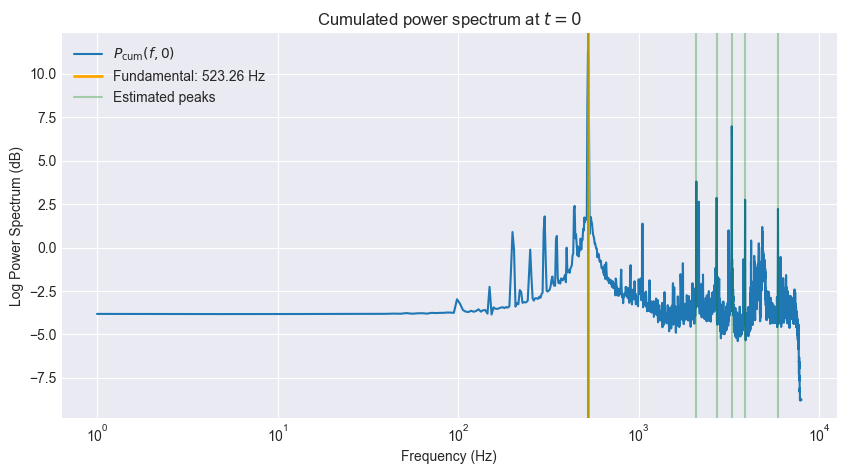

In [31]:
cum_power_spectrum = power_spectrum_3d(s[2], hop_length, n_fft, "hamming")
peaks = sig.find_peaks(cum_power_spectrum[0, :], prominence=7)[0]
f = peaks * sr / n_fft

plt.figure(figsize=(10, 5))
plt.title(r"Cumulated power spectrum at $t=0$")
fundamental = 261.63 * 2
X = np.linspace(1, sr / 2, n_fft // 2)
plt.plot(X, cum_power_spectrum[0, :], label = r"$P_{\mathrm{cum}}(f, 0)$")
plt.axvline(fundamental, label = f"Fundamental: {fundamental} Hz", color = "orange", linewidth = 2)

put_label = True
for freq in f:
    if put_label:
        plt.axvline(freq, color='g', alpha = .3, label = "Estimated peaks")
        put_label = False
    else:
        plt.axvline(freq, color='g', alpha = .3)

plt.legend()
plt.xlabel('Frequency (Hz)')
plt.ylabel('Log Power Spectrum (dB)')
plt.xscale('log')
plt.show()

In [8]:
hop_length = 1024
n_fft = 4096

In [9]:
poles = []
for signal in s:
    poles.append(pole_estimator(signal, sr, hop_length=hop_length, n_fft=n_fft, window_type="hamming", prominence = 4))
print( [pole.shape for pole in poles])

[(9,), (14,), (14,)]


In [14]:
excitation = frequency_domain_deconvolution(s = s[0], poles = poles[0], N_fft = 400000, e_length = 16000 * 3)
Audio(excitation, rate=sr)

In [15]:
N = 400000
e_length = sr * 3

In [16]:
excitation = least_squares_deconvolution(s, poles, N, e_length)

In [17]:
Audio(excitation, rate=sr)

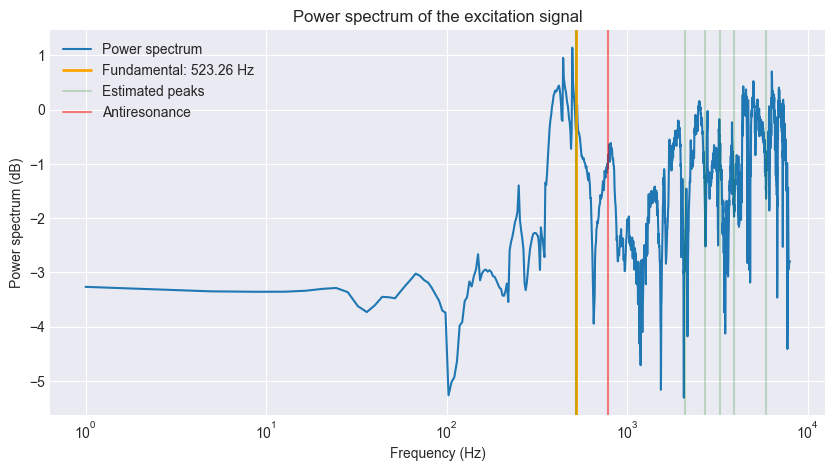

In [32]:
E = np.log(np.abs(np.fft.fft(excitation, n = n_fft))[:n_fft//2])
X = np.linspace(1, sr / 2, n_fft // 2)

plt.figure(figsize = (10,5))
plt.title("Power spectrum of the excitation signal")
plt.plot(X, E, label = "Power spectrum")
put_label = True
plt.axvline(fundamental, label = f"Fundamental: {fundamental} Hz", color = "orange", linewidth = 2)
for freq in f:
    if put_label:
        plt.axvline(freq, color='g', alpha = .2, label = "Estimated peaks")
        put_label = False
    else:
        plt.axvline(freq, color='g', alpha = .2)
plt.axvline(1.5 * f[0], color='r', alpha = .5, label = "Antiresonance")

plt.legend()
plt.xscale('log')
plt.xlabel('Frequency (Hz)')
plt.ylabel('Power spectrum (dB)')
plt.show()

In [20]:
synth = synthesis(excitation, poles[1], N)
Audio(synth, rate=sr)

## Mixing excitations and filters from different instruments

In [56]:
sr = 16000
s = load_piano_sound("C3", "M", sr)

In [72]:
hop_length = 1024
n_fft = 4096
e_length = 16000 * 10
N = 400000

In [73]:
poles = pole_estimator(s, sr, hop_length=hop_length, n_fft=n_fft, window_type="hamming", prominence = 7)

In [74]:
excitation = frequency_domain_deconvolution(s = s, poles = poles, N_fft = N, e_length = e_length)

In [75]:
Audio(excitation, rate=sr)

In [103]:
flute_sound = librosa.load("data/test_samples/A5_flute.wav", sr=sr, mono=True)[0]
Audio(flute_sound, rate=sr)

In [113]:
poles_flute = pole_estimator(flute_sound, sr, hop_length=hop_length, n_fft=n_fft, window_type="hamming", prominence = 10)
poles_flute.shape

(4,)

In [114]:
flute_ir = np.real(np.sum(poles_flute[:, None] ** np.arange(N)[None, :], axis = 0))
flute_ir.shape

(400000,)

In [115]:
H = np.fft.fft(flute_ir, n = N)
E = np.fft.fft(excitation, n = N)
X = H * E
x_synth = np.fft.ifft(X)
x_synth = np.real(x_synth)
Audio(x_synth, rate=sr)